# Modelo 1 - Clasificación de usuarios

## Notebook para probar diferentes configuraciones y obtener el modelo.
Este código lee los datos históricos de la clasificación de un conjunto de usuarios y los datos utilizados para realizar esta clasificación.

# 0. Configuración

Instalar pycaret si fuese necesario

In [1]:
pip install pycaret

/opt/conda/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
  Using cached pycaret-2.3.1-py3-none-any.whl (261 kB)
  Using cached scikit_learn-0.23.2-cp37-cp37m-manylinux1_x86_64.whl (6.8 MB)
  Using cached pyLDAvis-3.3.1-py2.py3-none-any.whl
  Using cached pyod-0.8.8-py3-none-any.whl
  Using cached yellowbrick-1.3.post1-py3-none-any.whl (271 kB)
  Using cached wordcloud-1.8.1-cp37-cp37m-manylinux1_x86_64.whl (366 kB)
  Using cached spacy-2.3.5-cp37-cp37m-manylinux2014_x86_64.whl (10.4 MB)
  Using cached mlflow-1.17.0-py3-none-any.whl (14.2 MB)
  Using cached mlxtend-0.18.0-py2.py3-none-any.whl (1.3 MB)
  Using cached umap_learn-0.5.1-py3-none-

In [ ]:
from pycaret.classification import *
o
from pycaret.regression import *
o
from pycaret.arules import *

In [19]:
import pandas as pd
from pycaret.classification import *
import datetime
import os
from boto3 import client
S3=client('s3')

# 1. Carga de datos

In [20]:
dataset_raw = pd.read_csv('s3://tfm-2021-darwinex/data/model1/dataset_model1.csv')
dataset_raw.head()

,userid,has_darwin,pfees,darwinia,dscore,commissions,investment,old_darwin,label
0,4acac908-516a-40f3-8d9e-a1a54b59d937,True,329.131762,513.338761,811.833174,6.100919,56.571613,True,2
1,53896cf7-e0ff-4c99-b71b-2640f2bdeb5c,True,329.131762,513.338761,626.675995,6.100919,0.000000,True,3
2,e079ea73-c4c6-4492-9fcf-39e877bd6cc8,True,0.000000,0.000000,0.000000,0.284045,0.000000,True,3
3,7c344536-ee4b-42dc-9731-d344078d0f54,True,0.022516,0.000000,0.000000,2.369245,0.000000,True,3
4,2be80745-12a6-4865-b27a-86f65c03e51a,False,0.000000,0.000000,0.000000,0.113741,0.000000,False,5


# 2. Iniciar PyCaret

A la hora de inicializar PyCaret solo hemos configurado la columna que es el objetivo (label_num) y las columnas a ignorar, el resto de parámetros están por defecto.

In [21]:
clf1 = setup(dataset_raw, normalize=False, target = 'label', ignore_features=['userid'], silent=True)

,Description,Value
0,session_id,6181
1,Target,label
2,Target Type,Multiclass
3,Label Encoded,"0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5"
4,Original Data,"(18000, 9)"
5,Missing Values,False
6,Numeric Features,5
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


# 3. Crear el modelo y elegir la mejor opción

In [22]:
top = compare_models(n_select=1)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.9999,1.0000,0.9999,0.9999,0.9999,0.9999,0.9999,0.0140
rf,Random Forest Classifier,0.9998,1.0000,0.9998,0.9998,0.9998,0.9998,0.9998,0.4180
gbc,Gradient Boosting Classifier,0.9998,1.0000,0.9998,0.9998,0.9998,0.9998,0.9998,2.6690
lightgbm,Light Gradient Boosting Machine,0.9988,0.9999,0.9988,0.9988,0.9988,0.9986,0.9986,0.3810
et,Extra Trees Classifier,0.9983,1.0000,0.9983,0.9983,0.9983,0.9980,0.9980,0.3690
knn,K Neighbors Classifier,0.9600,0.9946,0.9601,0.9608,0.9600,0.9520,0.9521,0.0980
lr,Logistic Regression,0.8541,0.9780,0.8534,0.8578,0.8516,0.8249,0.8269,1.6960
nb,Naive Bayes,0.7647,0.9624,0.7633,0.7619,0.7527,0.7176,0.7219,0.0120
svm,SVM - Linear Kernel,0.7031,0.0000,0.7018,0.7595,0.6967,0.6438,0.6612,0.1750
lda,Linear Discriminant Analysis,0.6668,0.9166,0.6643,0.7266,0.6019,0.5998,0.6215,0.0150


# 4. Ajustar hiperparámetros

In [23]:
top_tuned = tune_model(top)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,0.9992,0.9995,0.9992,0.9992,0.9992,0.9990,0.9990
2,0.9976,1.0000,0.9976,0.9977,0.9976,0.9971,0.9971
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
5,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
6,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
7,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
8,0.9984,1.0000,0.9984,0.9984,0.9984,0.9981,0.9981
9,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990


## 4.1 Calibramos el modelo para mostrar la probabilidad

In [24]:
calibrated_dt = calibrate_model(top_tuned)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,0.9992,0.9995,0.9992,0.9992,0.9992,0.9990,0.9990
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
5,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
6,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
7,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990
8,0.9984,1.0000,0.9984,0.9984,0.9984,0.9981,0.9981
9,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990


# 5. Probar modelo con datos de test

In [25]:
predict_new = predict_model(calibrated_dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9996,0.9998,0.9996,0.9996,0.9996,0.9996,0.9996


In [26]:
predict_new

,pfees,darwinia,dscore,commissions,investment,has_darwin_False,old_darwin_False,label,Label,Score
0,0.000000,0.000000,0.000000,12.048235,0.000000,0.0,1.0,1,1,0.9949
1,0.607257,0.000000,0.000000,19.619707,0.000000,1.0,1.0,1,1,0.9949
2,0.000000,0.000000,0.000000,0.449269,0.000000,0.0,1.0,4,4,0.9948
3,1.112912,2.253866,644.912903,0.249568,0.000000,0.0,0.0,3,3,0.9948
4,0.000000,0.000000,0.000000,1.110168,0.000000,0.0,1.0,4,4,0.9948
...,...,...,...,...,...,...,...,...,...,...
5396,0.007381,0.000000,821.700500,4.940346,0.000000,0.0,0.0,2,2,0.9948
5397,80.217461,145.955124,851.224121,2.373862,2.616078,0.0,0.0,2,2,0.9948
5398,0.000000,0.000000,0.000000,5.945699,0.000000,0.0,1.0,4,4,0.9948
5399,0.025059,15.863089,0.000000,0.470432,10.020266,0.0,0.0,0,0,0.9949


 # 6. Mostrar información del modelo
 ## 6.1 Area Under the Curve

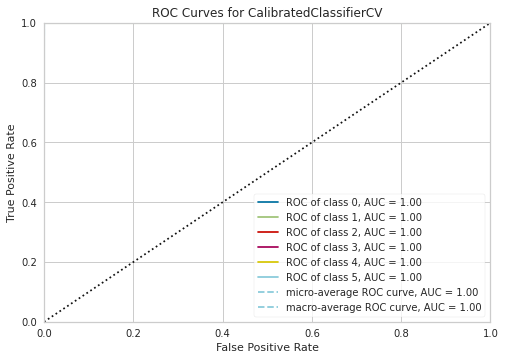

In [27]:
try:
    plot_model(calibrated_dt, plot='auc')
except Exception as ex:
    print("This model can't measure auc.")

## 6.2 Precision Recall Curve

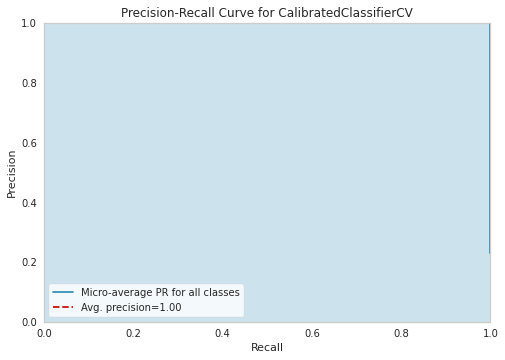

In [28]:
plot_model(calibrated_dt, plot='pr')

## 6.3 Confusion Matrix

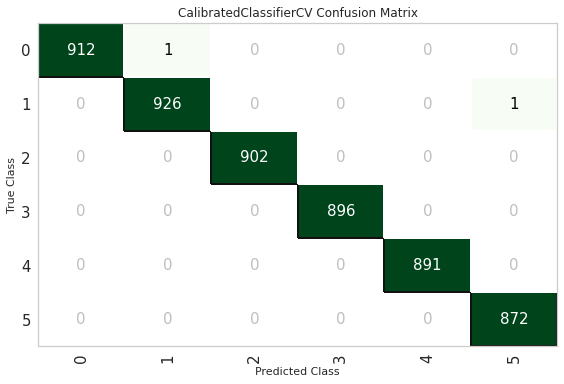

In [29]:
plot_model(calibrated_dt, plot='confusion_matrix')

## 6.4 Class Prediction Error

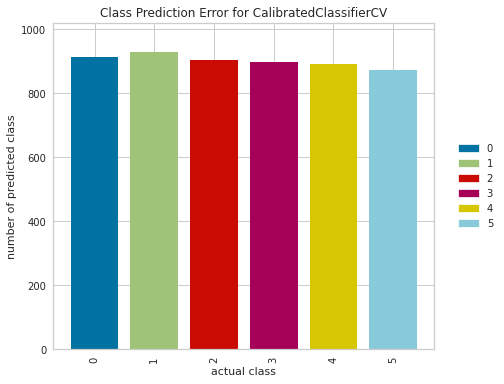

In [30]:
plot_model(calibrated_dt, plot='error')

## 6.5 Classification Report

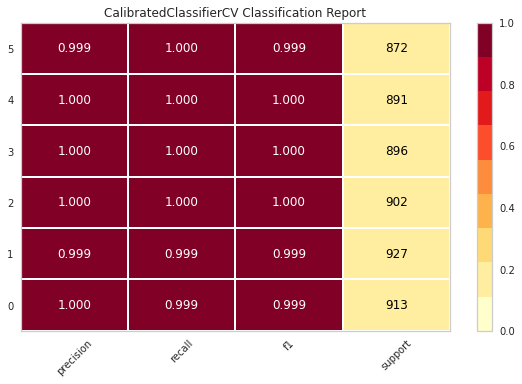

In [31]:
plot_model(calibrated_dt, plot='class_report')

## 6.6 Learning Curve

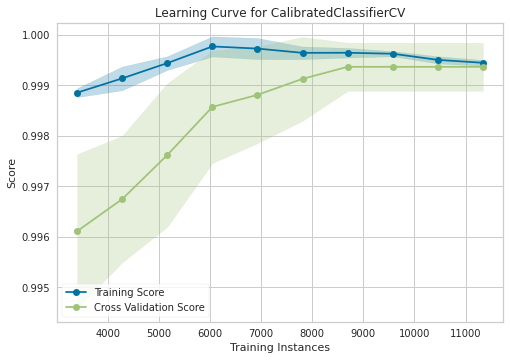

In [32]:
plot_model(calibrated_dt, plot='learning')

## 6.8 Feature Importance

El modelo calibrado no permite representar esta grafica, por lo que utilizamos el modelo justo antes de calibrarlo.

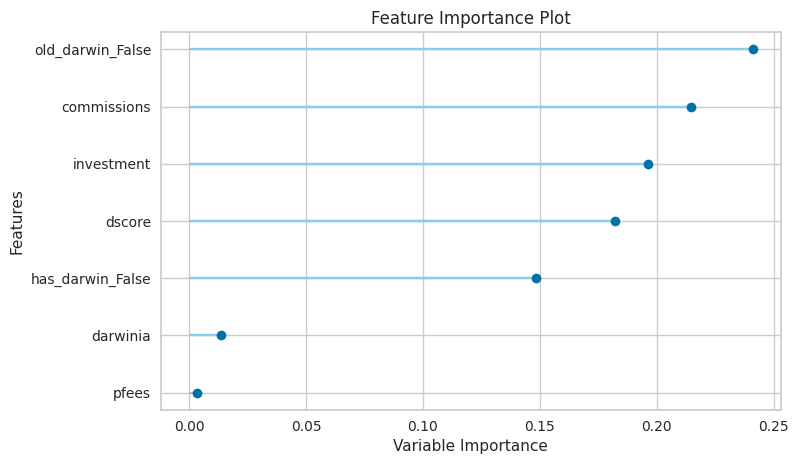

In [33]:
plot_model(top_tuned, plot='feature')

## 6.9 Decision Trees

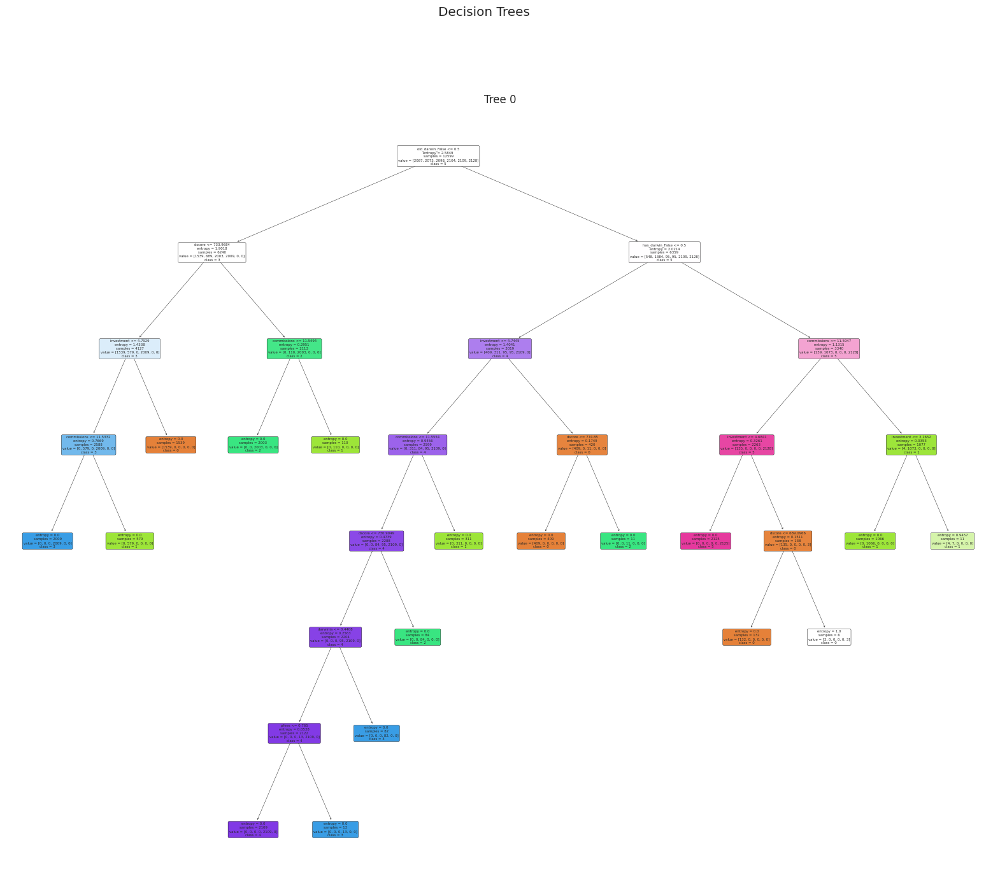

In [36]:
plot_model(top_tuned, plot='tree')

 # 7. Finalizar y guardar modelo

In [35]:
final_model = finalize_model(calibrated_dt)
save_model(final_model, model_name='model1', verbose=False)
S3.upload_file('model1.pkl', 'tfm-2021-darwinex', 'models/model1/final_model.pkl')
S3.upload_file('model1.pkl', 'tfm-2021-darwinex', 'models/model1/history/{}_model'.format(datetime.datetime.now()))